<a href="https://colab.research.google.com/github/eru2/Ai_Models/blob/main/mask.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#colab의 시스템 사양 알아 보기
from tensorflow.python.client import device_lib
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 15462181120979864678
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 14626652160
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 392398102341190332
 physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
 xla_global_id: 416903419]

In [ ]:
import platform
platform.platform()

'Linux-6.1.58+-x86_64-with-glibc2.35'

In [ ]:
!cat /etc/issue.net
!cat /proc/meminfo
!cat /proc/cpuinfo
#디스크정보보기
!df -h
#GPU정보보기
!nvidia-sml
#파이썬버젼확인
!python --version


Ubuntu 22.04.3 LTS
MemTotal:       13290484 kB
MemFree:         8162592 kB
MemAvailable:   12014144 kB
Buffers:          246844 kB
Cached:          3797820 kB
SwapCached:            0 kB
Active:           517744 kB
Inactive:        4205788 kB
Active(anon):       1108 kB
Inactive(anon):   689504 kB
Active(file):     516636 kB
Inactive(file):  3516284 kB
Unevictable:           4 kB
Mlocked:               4 kB
SwapTotal:             0 kB
SwapFree:              0 kB
Dirty:             10480 kB
Writeback:             0 kB
AnonPages:        678960 kB
Mapped:           726572 kB
Shmem:             11652 kB
KReclaimable:     119144 kB
Slab:             165892 kB
SReclaimable:     119144 kB
SUnreclaim:        46748 kB
KernelStack:        4944 kB
PageTables:         8532 kB
SecPageTables:         0 kB
NFS_Unstable:          0 kB
Bounce:                0 kB
WritebackTmp:          0 kB
CommitLimit:     6645240 kB
Committed_AS:    2601200 kB
VmallocTotal:   34359738367 kB
VmallocUsed:       79300 k

In [ ]:
%cd /content

/content


In [ ]:
!git clone https://github.com/ultralytics/yolov5

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [ ]:
%pwd

'/content'

In [ ]:
%cd /content/yolov5
%pip install -r requirements.txt

/content/yolov5


# 데이터의 위치   
https://universe.roboflow.com/roboflow-100/mask-wearing-608pr/dataset/2

In [ ]:
#폴더를 만든다
%mkdir /content/yolov5/mask
%cd /content/yolov5/mask

mkdir: cannot create directory ‘/content/yolov5/mask’: File exists
/content/yolov5/mask


In [ ]:
!curl -L "https://universe.roboflow.com/ds/crUAtVprl3?key=ayZuF2L3bL" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   902  100   902    0     0   1733      0 --:--:-- --:--:-- --:--:--  1734
100 18.5M  100 18.5M    0     0  5956k      0  0:00:03  0:00:03 --:--:-- 7706k
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
 extracting: test/images/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.d72d62bb4088957c50f0c9698706728e.jpg  
 extracting: test/images/1224331650_g_400-w_g_jpg.rf.2cb01f1b9e9f0b776d9631d83a58c3e8.jpg  
 extracting: test/images/126202-untitled-design-13_jpg.rf.e7f355f972d787ad631c27c79fb8f257.jpg  
 extracting: test/images/1288126-10255706714jpg_jpg.rf.74a1efbaf0c87eec4659d2b695b9dd39.jpg  
 extracting: test/images/15391513324714o1n0r10n6_jpg.rf.061cc04c6d0416221c5c63320

In [ ]:
%cat /content/yolov5/mask/data.yaml

train: ../train/images
val: ../valid/images

nc: 2
names: ['mask', 'no-mask']

In [ ]:
from glob import glob
train_img_list = glob('/content/yolov5/mask/train/images/*.jpg')
test_img_list = glob('/content/yolov5/mask/valid/images/*.jpg')
valid_img_list = glob('/content/yolov5/mask/valid/images/*.jpg')
print(len(train_img_list), len(test_img_list), len(valid_img_list))

105 29 29


In [ ]:
import yaml
with open('/content/yolov5/mask/train.txt','w') as f:
    f.write('\n'.join(train_img_list) + '\n')
with open('/content/yolov5/mask/test.txt','w') as f:
    f.write('\n'.join(test_img_list) + '\n')
with open('/content/yolov5/mask/val.txt','w') as f:
    f.write('\n'.join(valid_img_list) + '\n')

In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/mask/data.yaml

train: /content/yolov5/mask/train/images
val: /content/yolov5/mask/valid/images

nc: 2
names: ['mask', 'no-mask']

In [ ]:
%cat /content/yolov5/mask/data.yaml


train: /content/yolov5/mask/train/images
val: /content/yolov5/mask/valid/images

nc: 2
names: ['mask', 'no-mask']


In [ ]:
import yaml

with open('/content/yolov5/mask/data.yaml','r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: {num_classes} # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]

In [ ]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# YOLOv5 🚀 by Ultralytics, AGPL-3.0 license

# Parameters
nc: 2 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 

In [ ]:
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 1000 --data ./mask/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name mask_result --cache

/content/yolov5
2024-05-16 08:09:04.468388: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-16 08:09:04.468443: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-16 08:09:04.469883: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=, cfg=./models/custom_yolov5s.yaml, data=./mask/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1000, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, 

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 9873), started 2:01:02 ago. (Use '!kill 9873' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!ls /content/yolov5/runs/train/mask_result5/

ls: cannot access '/content/yolov5/runs/train/mask_result5/': No such file or directory


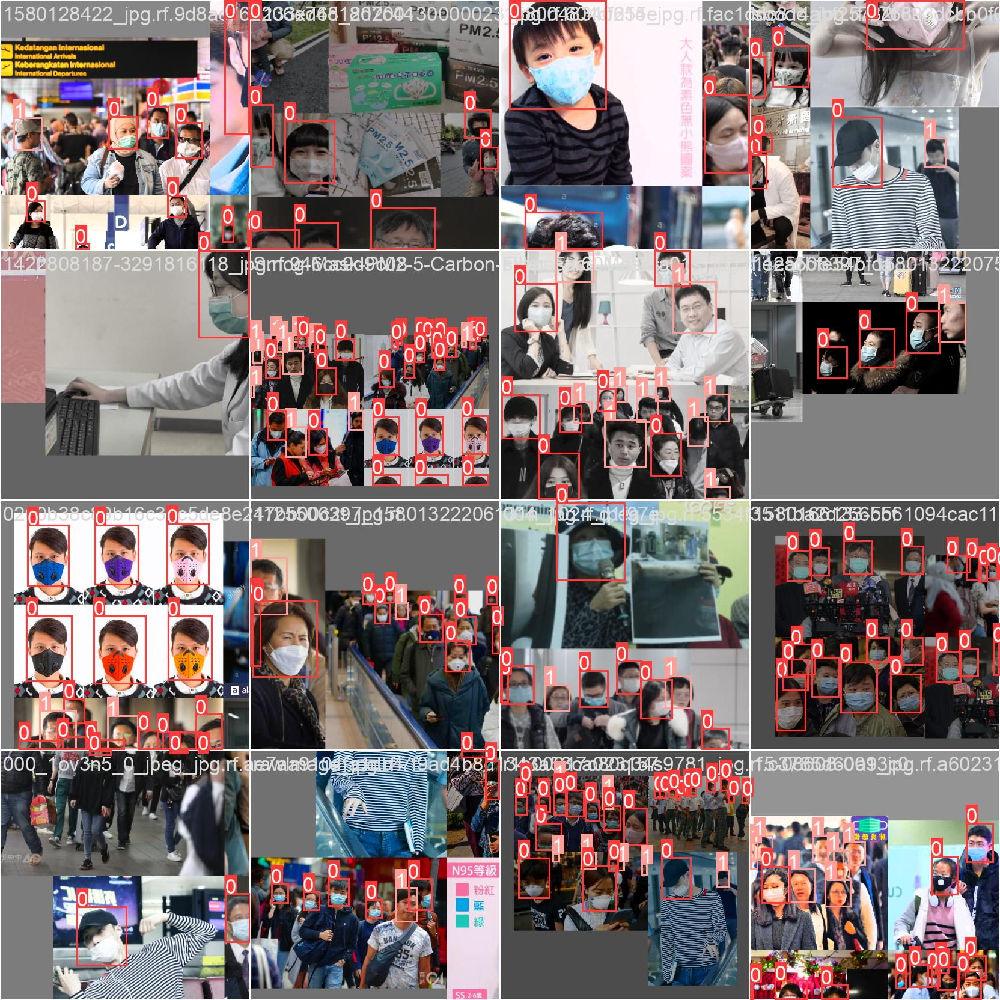

In [ ]:
!python val.py --weights /content/yolov5/runs/train/mask_result/weights/best.pt --data /content/yolov5/mask/data.yaml --img 640 --iou 0.65 --half

val: data=/content/yolov5/mask/data.yaml, weights=['/content/yolov5/runs/train/mask_result/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v7.0-312-g1bcd17ee Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
val: Scanning /content/yolov5/mask/valid/labels.cache... 29 images, 0 backgrounds, 0 corrupt: 100% 29/29 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances          P       

In [ ]:
!python detect.py --weights /content/yolov5/runs/train/mask_result/weights/best.pt --img 640 --conf 0.4 --source ./mask/test/images

detect: weights=['/content/yolov5/runs/train/mask_result/weights/best.pt'], source=./mask/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-312-g1bcd17ee Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/15 /content/yolov5/mask/test/images/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.d72d62bb4088957c50f0c9698706728e.jpg: 352x640 2 masks, 86.6ms
image 2/15 /content/yolov5/mask/test/images/1224331650_g_400-w_g_jpg.rf.2cb01f1b9e9f0b776d9631d83a5

In [ ]:
%ls /content/yolov5/runs/train/mask_result/weights

best.pt  last.pt


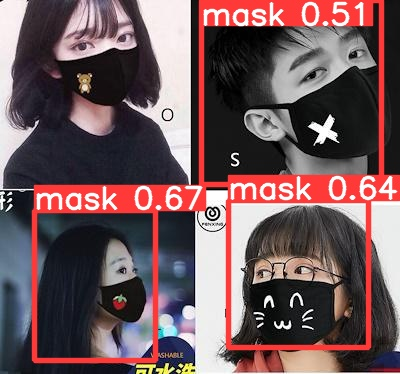

In [ ]:
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/yolov5/runs/detect/exp/*.jpg'))

display(Image(filename=image_name))

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%mkdir /content/drive/MyDrive/mask
%cp /content/yolov5/runs/train/mask_result/weights/best.pt /content/drive/MyDrive/mask